In [1]:
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
import torch.nn.functional as F
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='darkgrid', font_scale=1.2)

In [63]:
data = "C:/Users/humza/Downloads/cats" 

# Task 2: EDA

## Technique 1: Sample batch of images

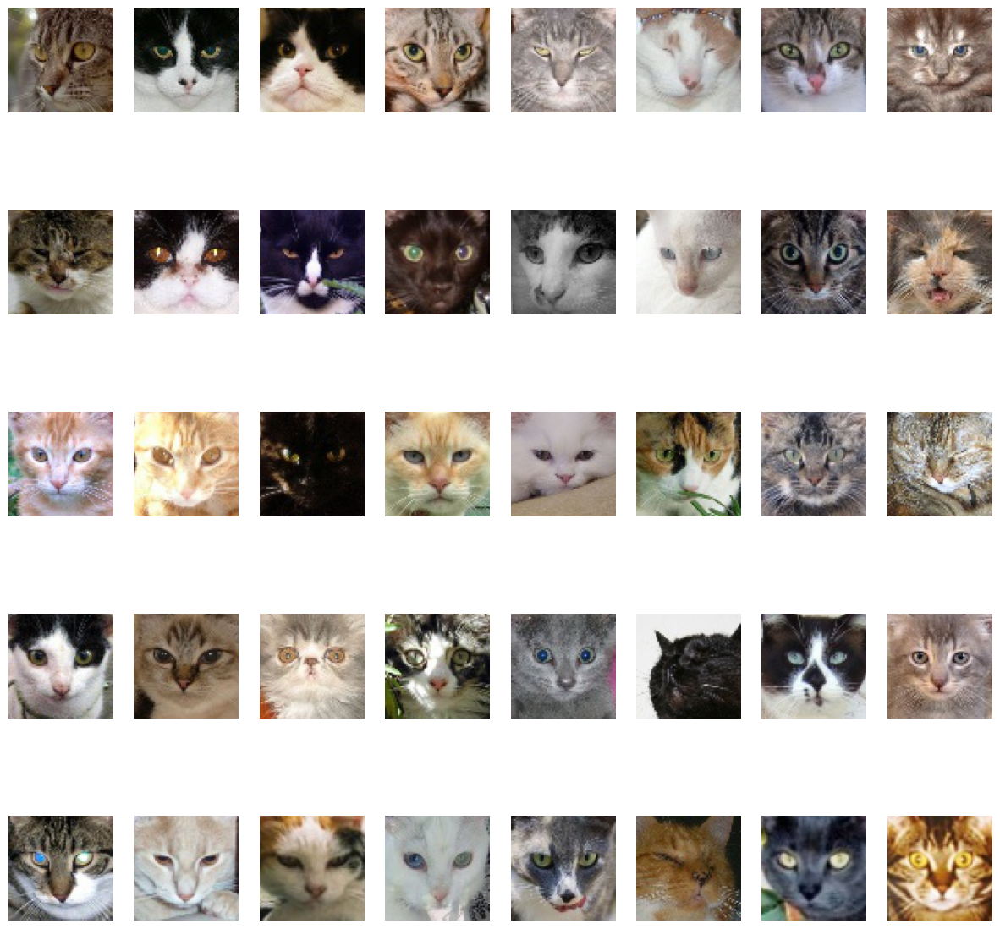

In [28]:
import matplotlib.pyplot as plt
import numpy as np
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

# Dataloader
train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)

def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

# Function to visualize a batch of images
def show_batch(dl, num_samples=40):
    images, _ = next(iter(dl))
    images = images[:num_samples]  # Select num_samples images from the batch
    images = denorm(images)

    nrows = 5
    ncols = num_samples // nrows

    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 15))
    axes = axes.flatten()
    for i, img in enumerate(images):
        ax = axes[i]
        img = img.permute(1, 2, 0)
        ax.imshow(img)
        ax.axis('off')
    plt.show()

# Displays images
show_batch(train_dl, num_samples=40)

## Technique 2: Memory calculation of dataset

In [37]:
# Image dimensions and properties
image_width = 64
image_height = 64
num_channels = 3 
num_bytes_per_float = 4

# Size of each image tensor in bytes
image_tensor_size = image_width * image_height * num_channels * num_bytes_per_float

# Total number of images in the dataset
total_images = len(train_ds)

# Total memory usage of the dataset in bytes
total_memory_bytes = total_images * image_tensor_size

# Convervion to readable format
total_memory_mb = total_memory_bytes / (1024 * 1024)

print(f"Total memory usage of the cat images dataset: {total_memory_mb} MB")

Total memory usage of the cat images dataset: 738.140625 MB


## Technique 3: Finding image outliers in the dataset (images that are significantly different from others)

C:\Anaconda\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Anaconda\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to C:\Users\humza/.cache\torch\hub\checkpoints\resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:02<00:00, 36.0MB/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


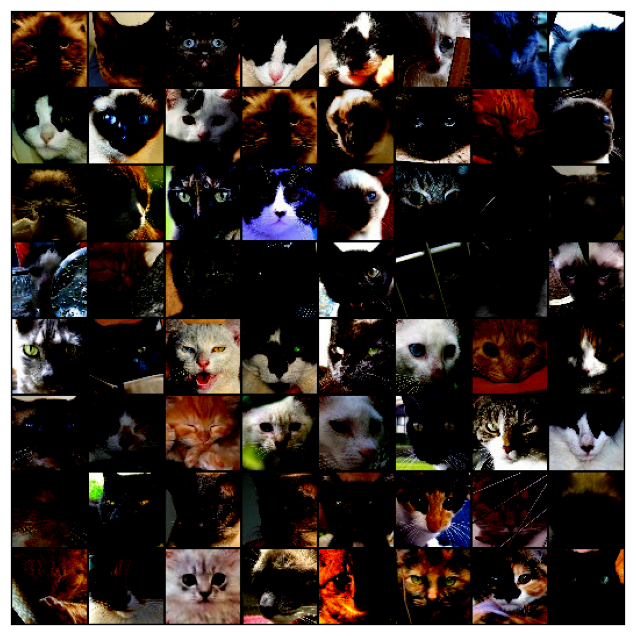

In [36]:
import torchvision.models as models
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

# Pretrained Model
model = models.resnet50(pretrained=True)
model.eval()  


# Dataloader
train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=False)

# Function to extract features
def extract_features(model, dataloader):
    features = []
    with torch.no_grad():
        for inputs, _ in dataloader:
            outputs = model(inputs)  # You may need to adapt this depending on your model
            features.extend(outputs.cpu().numpy())
    return np.array(features)

# Extraction of features
image_features = extract_features(model, train_dl)

from sklearn.ensemble import IsolationForest

# Isolation Forest for outlier detection
clf = IsolationForest(random_state=0).fit(image_features)
outlier_predictions = clf.predict(image_features)

# Outlier images
outlier_indices = np.where(outlier_predictions == -1)[0]
outlier_images = [train_ds[i][0] for i in outlier_indices]

# Function to show images
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(images[:nmax]).permute(1, 2, 0))
    plt.show()

# Displays outlier images
show_images(outlier_images)

## Technique 4: Number of Outliers

In [39]:
outlier_count = len(outlier_indices)  
print(outlier_count)

946


# Technique 5: Pixel Intensity Analysis

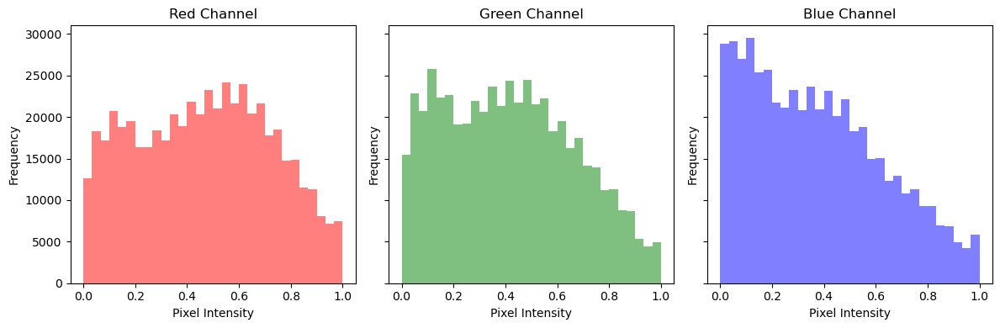

In [64]:
import matplotlib.pyplot as plt
import numpy as np
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)

def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

# Function to plot pixel intensity histograms
def plot_pixel_intensity_histogram(images):
    images = denorm(images)
    pixels = images.view(images.size(0), 3, -1)

    fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True)
    colors = ['red', 'green', 'blue']
    for i, color in enumerate(colors):
        axes[i].hist(pixels[:, i, :].numpy().flatten(), bins=30, color=color, alpha=0.5)
        axes[i].set_title(f'{color.capitalize()} Channel')
        axes[i].set_xlabel('Pixel Intensity')
        axes[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

# Extracts a batch of images
images, _ = next(iter(train_dl))

# Plots pixel intensity histograms for the batch
plot_pixel_intensity_histogram(images)

# Task 4: Preprocessing

In [27]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

train_ds = ImageFolder(data, transform=tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.ToTensor(),
    tt.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)

# Machine Learning Models

# Generative Adversarial Network (50 epochs)

Epoch [1/50], d_loss: 1.2750, g_loss: 2.6785
Epoch [2/50], d_loss: 0.6947, g_loss: 12.4264
Epoch [3/50], d_loss: 0.2770, g_loss: 4.9733
Epoch [4/50], d_loss: 1.0875, g_loss: 9.9925
Epoch [5/50], d_loss: 1.1668, g_loss: 7.1586
Epoch [6/50], d_loss: 0.1603, g_loss: 5.0444
Epoch [7/50], d_loss: 2.5197, g_loss: 7.9114
Epoch [8/50], d_loss: 0.2237, g_loss: 6.8786
Epoch [9/50], d_loss: 0.8798, g_loss: 5.3333
Epoch [10/50], d_loss: 1.0042, g_loss: 4.2773
Epoch [11/50], d_loss: 0.9553, g_loss: 13.1051
Epoch [12/50], d_loss: 0.8413, g_loss: 3.5038
Epoch [13/50], d_loss: 0.1936, g_loss: 7.3027
Epoch [14/50], d_loss: 0.3050, g_loss: 3.9014
Epoch [15/50], d_loss: 0.1641, g_loss: 6.2887
Epoch [16/50], d_loss: 0.3993, g_loss: 10.5512
Epoch [17/50], d_loss: 0.6036, g_loss: 4.6616
Epoch [18/50], d_loss: 0.0393, g_loss: 5.3263
Epoch [19/50], d_loss: 1.8685, g_loss: 0.0080
Epoch [20/50], d_loss: 0.5768, g_loss: 3.9785
Epoch [21/50], d_loss: 0.1772, g_loss: 5.9811
Epoch [22/50], d_loss: 0.5243, g_loss: 2

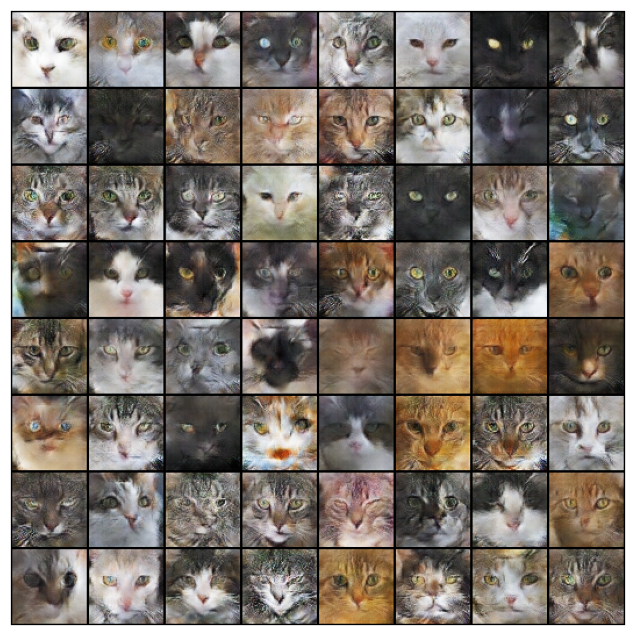

In [29]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Creation of GAN Components
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# Hyperparameters for GAN
nz = 100 
ngf = 64 
ndf = 64  
nc = 3  

# Creation of the generator and discriminator
generator = Generator(nz, ngf, nc)
discriminator = Discriminator(ndf, nc)

# Definition of Optimizers for both Generator and Discriminator
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Definition of Loss Function
criterion = nn.BCELoss()

# Training Loop
num_epochs = 50  

for epoch in range(num_epochs):
    for real_images, _ in train_dl:
        batch_size = real_images.size(0)

        # Training of Discriminator
        real_labels = torch.ones(batch_size)
        fake_labels = torch.zeros(batch_size)

        discriminator.zero_grad()

        # Real images
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, nz, 1, 1)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        d_optimizer.step()

        # Training of Generator
        generator.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        g_optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss_real.item() + d_loss_fake.item():.4f}, g_loss: {g_loss.item():.4f}")

# Function to show generated images
def show_generated_images(generator, num_images=64):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images), nrow=8).permute(1, 2, 0))
    plt.show()

# Displays some generated images
show_generated_images(generator)

In [77]:
def realism_score(generator, discriminator, nz, device='cpu', num_images=1000):
    generator.eval()
    discriminator.eval()

    # Generates a batch of latent vectors
    z = torch.randn(num_images, nz, 1, 1, device=device)

    # Generates fake images from the latent vectors
    with torch.no_grad():
        fake_images = generator(z)

    # Passes the fake images through the discriminator
    with torch.no_grad():
        outputs = discriminator(fake_images)

    # Calculate the average output of the discriminator
    score = outputs.mean().item()

    # Switch back to train mode
    generator.train()
    discriminator.train()

    return score

# Defines the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Moves models to the correct device
generator = generator.to(device)
discriminator = discriminator.to(device)

# Calculates the realism score
score = realism_score(generator, discriminator, nz, device=device)
print("Realism Score:", score)

Realism Score: 0.04816216975450516


# Boosting Techniques

# Removing Outliers (1 epoch)

Epoch [1/1], d_loss: 0.4200, g_loss: 3.6553


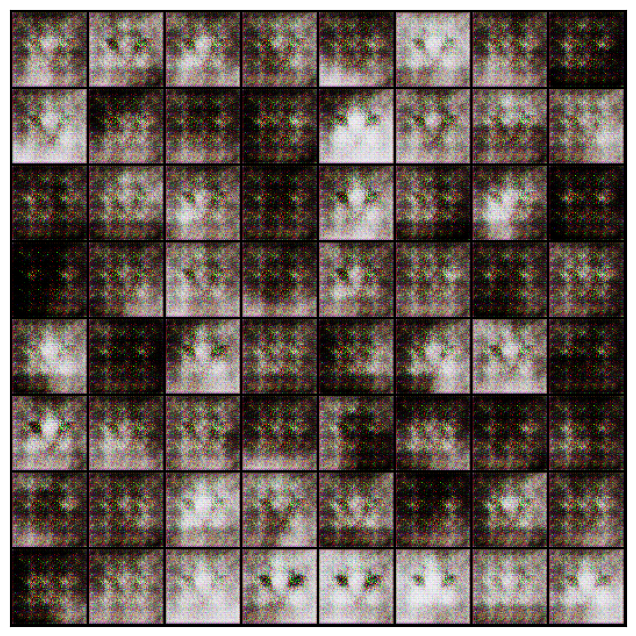

In [57]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Loads dataset without normalization for outlier detection
train_ds_raw = datasets.ImageFolder(root=data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor()
]))

# Outlier detection function
def is_outlier(image, threshold=3):
    image_array = image.numpy()
    mean, std = np.mean(image_array), np.std(image_array)
    return mean > mean_global + threshold * std_global or mean < mean_global - threshold * std_global

# Computes the global mean and std for the dataset
means, stds = [], []
for image, _ in train_ds_raw:
    image_array = image.numpy()
    means.append(np.mean(image_array))
    stds.append(np.std(image_array))
mean_global, std_global = np.mean(means), np.mean(stds)

# Filters out outliers
filtered_indices = [i for i, (img, _) in enumerate(train_ds_raw) if not is_outlier(img)]
filtered_ds = torch.utils.data.Subset(train_ds_raw, filtered_indices)

# Applies normalization to the filtered dataset
filtered_ds.dataset.transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

# DataLoader for the filtered dataset
train_dl = DataLoader(filtered_ds, batch_size=batch_size, shuffle=True)

# Creation of GAN Components
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# Hyperparameters for GAN
nz = 100 
ngf = 64 
ndf = 64  
nc = 3  

# Creation of the generator and discriminator
generator = Generator(nz, ngf, nc)
discriminator = Discriminator(ndf, nc)

# Definition of the Optimizers for both Generator and Discriminator
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Definition of Loss Function
criterion = nn.BCELoss()

# Training Loop
num_epochs = 1

for epoch in range(num_epochs):
    for real_images, _ in train_dl:
        batch_size = real_images.size(0)

        # Training of Discriminator
        real_labels = torch.ones(batch_size)
        fake_labels = torch.zeros(batch_size)

        discriminator.zero_grad()

        # Real images
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, nz, 1, 1)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        d_optimizer.step()

        # Training of Generator
        generator.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        g_optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss_real.item() + d_loss_fake.item():.4f}, g_loss: {g_loss.item():.4f}")

# Function to show generated images
def show_generated_images(generator, num_images=64):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images), nrow=8).permute(1, 2, 0))
    plt.show()
    
# Displays some generated images after training
show_generated_images(generator)

In [78]:
def calculate_realism_score(generator, discriminator, nz, num_samples=1000, device='cpu'):
    generator.eval()
    discriminator.eval()

    # Generates random noise to feed into the generator
    noise = torch.randn(num_samples, nz, 1, 1, device=device)

    # Generates fake images using the generator
    with torch.no_grad():
        fake_images = generator(noise)

    # Evaluates the fake images using the discriminator
    with torch.no_grad():
        predictions = discriminator(fake_images)

    # Calculates the average score from the discriminator
    realism_score = torch.mean(predictions).item()

    # Sets the models back to training mode
    generator.train()
    discriminator.train()

    return realism_score

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator.to(device)
discriminator.to(device)

# Calculates the realism score
score = calculate_realism_score(generator, discriminator, nz, device=device)
print(f"Realism Score: {score}")

Realism Score: 0.04678630828857422


# Removing Outliers (18 epochs)

Epoch [1/18], d_loss: 2.0773, g_loss: 1.9525
Epoch [2/18], d_loss: 0.4587, g_loss: 4.5898
Epoch [3/18], d_loss: 0.1424, g_loss: 3.7456
Epoch [4/18], d_loss: 0.4449, g_loss: 7.1019
Epoch [5/18], d_loss: 0.1153, g_loss: 4.7526
Epoch [6/18], d_loss: 0.0059, g_loss: 7.0513
Epoch [7/18], d_loss: 0.0574, g_loss: 6.9749
Epoch [8/18], d_loss: 0.1234, g_loss: 6.0971
Epoch [9/18], d_loss: 0.3019, g_loss: 4.3333
Epoch [10/18], d_loss: 0.0275, g_loss: 4.2831
Epoch [11/18], d_loss: 1.0125, g_loss: 6.5040
Epoch [12/18], d_loss: 0.0601, g_loss: 6.1658
Epoch [13/18], d_loss: 0.0208, g_loss: 4.2252
Epoch [14/18], d_loss: 0.0255, g_loss: 5.0328
Epoch [15/18], d_loss: 0.0073, g_loss: 8.1371
Epoch [16/18], d_loss: 0.0088, g_loss: 7.1822
Epoch [17/18], d_loss: 0.0425, g_loss: 6.1479
Epoch [18/18], d_loss: 0.2697, g_loss: 7.1944


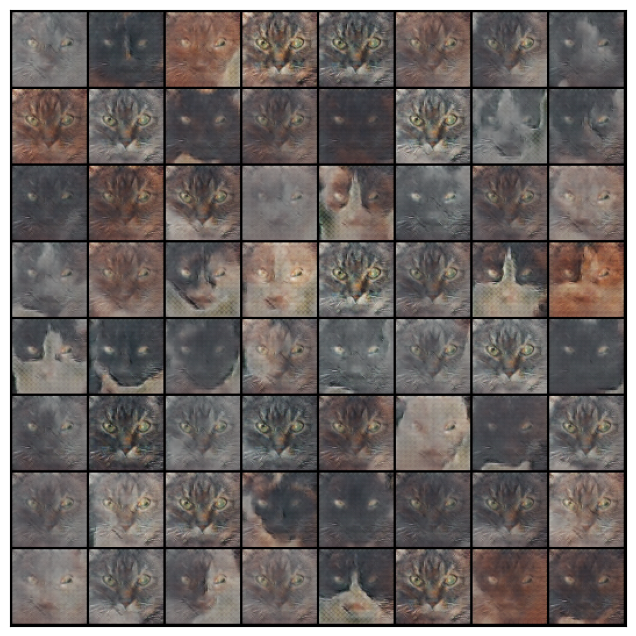

In [58]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Loads dataset without normalization for outlier detection
train_ds_raw = datasets.ImageFolder(root=data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor()
]))

# Outlier detection function
def is_outlier(image, threshold=3):
    image_array = image.numpy()
    mean, std = np.mean(image_array), np.std(image_array)
    return mean > mean_global + threshold * std_global or mean < mean_global - threshold * std_global

# Computes the global mean and std for the dataset
means, stds = [], []
for image, _ in train_ds_raw:
    image_array = image.numpy()
    means.append(np.mean(image_array))
    stds.append(np.std(image_array))
mean_global, std_global = np.mean(means), np.mean(stds)

# Filters out outliers
filtered_indices = [i for i, (img, _) in enumerate(train_ds_raw) if not is_outlier(img)]
filtered_ds = torch.utils.data.Subset(train_ds_raw, filtered_indices)

# Applies normalization to the filtered dataset
filtered_ds.dataset.transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

# DataLoader for the filtered dataset
train_dl = DataLoader(filtered_ds, batch_size=batch_size, shuffle=True)

# Creation of GAN Components
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# Hyperparameters for GAN
nz = 100 
ngf = 64 
ndf = 64  
nc = 3  

# Creation of the generator and discriminator
generator = Generator(nz, ngf, nc)
discriminator = Discriminator(ndf, nc)

# Definition of the Optimizers for both Generator and Discriminator
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Definition of Loss Function
criterion = nn.BCELoss()

# Training Loop
num_epochs = 18

for epoch in range(num_epochs):
    for real_images, _ in train_dl:
        batch_size = real_images.size(0)

        # Training of Discriminator
        real_labels = torch.ones(batch_size)
        fake_labels = torch.zeros(batch_size)

        discriminator.zero_grad()

        # Real images
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, nz, 1, 1)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        d_optimizer.step()

        # Training of Generator
        generator.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        g_optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss_real.item() + d_loss_fake.item():.4f}, g_loss: {g_loss.item():.4f}")

# Function to show generated images
def show_generated_images(generator, num_images=64):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images), nrow=8).permute(1, 2, 0))
    plt.show()
    
# Displays some generated images after training
show_generated_images(generator)

In [75]:
def realism_score(generator, discriminator, nz, num_images=1000, device='cpu'):
    generator.eval()
    discriminator.eval()

    # Generates a batch of latent vectors
    z = torch.randn(num_images, nz, 1, 1, device=device)

    # Generates fake images from the latent vectors
    with torch.no_grad():
        fake_images = generator(z)

    # Evaluates the fake images with the discriminator
    with torch.no_grad():
        outputs = discriminator(fake_images)

    # Calculates the average output of the discriminator
    score = outputs.mean().item()

    # Switches back to train mode
    generator.train()
    discriminator.train()

    return score

# Ensures the models and the generated latent vectors are on the same device (CPU or GPU)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
generator = generator.to(device)
discriminator = discriminator.to(device)

score = realism_score(generator, discriminator, nz, device=device)
print("Realism Score:", score)

Realism Score: 0.04653727263212204


# Removing Outliers (50 epochs)

Epoch [1/50], d_loss: 0.9857, g_loss: 6.7861
Epoch [2/50], d_loss: 0.7309, g_loss: 3.4902
Epoch [3/50], d_loss: 0.4230, g_loss: 3.2288
Epoch [4/50], d_loss: 1.1315, g_loss: 12.6671
Epoch [5/50], d_loss: 0.5762, g_loss: 1.6638
Epoch [6/50], d_loss: 0.9735, g_loss: 9.6649
Epoch [7/50], d_loss: 2.0026, g_loss: 0.4710
Epoch [8/50], d_loss: 0.9970, g_loss: 7.9384
Epoch [9/50], d_loss: 0.6697, g_loss: 10.2412
Epoch [10/50], d_loss: 2.1428, g_loss: 4.1515
Epoch [11/50], d_loss: 0.2039, g_loss: 4.8738
Epoch [12/50], d_loss: 0.7111, g_loss: 4.0111
Epoch [13/50], d_loss: 0.4291, g_loss: 7.0153
Epoch [14/50], d_loss: 1.1007, g_loss: 15.5229
Epoch [15/50], d_loss: 0.3302, g_loss: 5.1188
Epoch [16/50], d_loss: 1.1691, g_loss: 7.1529
Epoch [17/50], d_loss: 1.1644, g_loss: 0.1288
Epoch [18/50], d_loss: 2.2212, g_loss: 17.2037
Epoch [19/50], d_loss: 0.5998, g_loss: 3.5090
Epoch [20/50], d_loss: 1.4016, g_loss: 0.3215
Epoch [21/50], d_loss: 0.1325, g_loss: 3.6969
Epoch [22/50], d_loss: 0.3599, g_loss: 

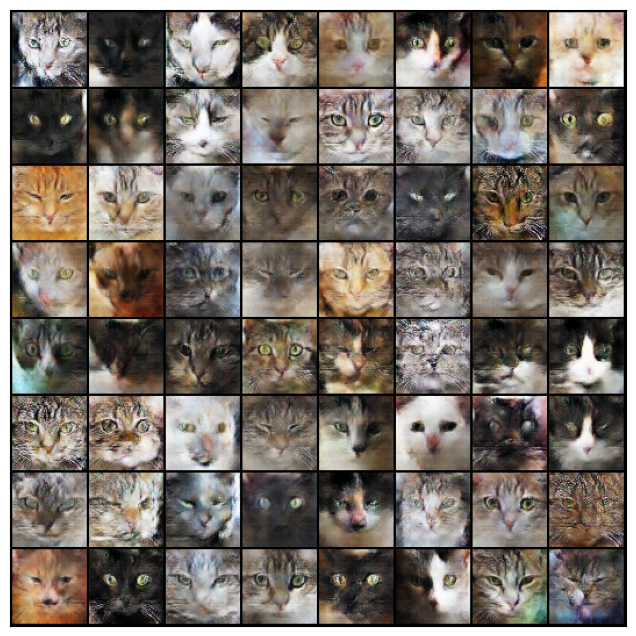

In [65]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Loads dataset without normalization for outlier detection
train_ds_raw = datasets.ImageFolder(root=data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor()
]))

# Outlier detection function
def is_outlier(image, threshold=3):
    image_array = image.numpy()
    mean, std = np.mean(image_array), np.std(image_array)
    return mean > mean_global + threshold * std_global or mean < mean_global - threshold * std_global

# Computes the global mean and std for the dataset
means, stds = [], []
for image, _ in train_ds_raw:
    image_array = image.numpy()
    means.append(np.mean(image_array))
    stds.append(np.std(image_array))
mean_global, std_global = np.mean(means), np.mean(stds)

# Filters out outliers
filtered_indices = [i for i, (img, _) in enumerate(train_ds_raw) if not is_outlier(img)]
filtered_ds = torch.utils.data.Subset(train_ds_raw, filtered_indices)

# Applies normalization to the filtered dataset
filtered_ds.dataset.transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

# DataLoader for the filtered dataset
train_dl = DataLoader(filtered_ds, batch_size=batch_size, shuffle=True)

# Creation of GAN Components
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# Hyperparameters for GAN
nz = 100 
ngf = 64 
ndf = 64  
nc = 3  

# Creation of the generator and discriminator
generator = Generator(nz, ngf, nc)
discriminator = Discriminator(ndf, nc)

# Definition of Optimizers for both Generator and Discriminator
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Definition of Loss Function
criterion = nn.BCELoss()

# Training Loop
num_epochs = 50

for epoch in range(num_epochs):
    for real_images, _ in train_dl:
        batch_size = real_images.size(0)

        # Training of Discriminator
        real_labels = torch.ones(batch_size)
        fake_labels = torch.zeros(batch_size)

        discriminator.zero_grad()

        # Real images
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, nz, 1, 1)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        d_optimizer.step()

        # Training of Generator
        generator.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        g_optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss_real.item() + d_loss_fake.item():.4f}, g_loss: {g_loss.item():.4f}")

# Function to show generated images
def show_generated_images(generator, num_images=64):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images), nrow=8).permute(1, 2, 0))
    plt.show()
    
# Displays some generated images after training
show_generated_images(generator)

In [87]:
def calculate_realism_score(generator, discriminator, nz, num_samples=1000):
    # Generates a batch of fake images
    z = torch.randn(num_samples, nz, 1, 1)
    fake_images = generator(z)

    # Evaluates the fake images with the discriminator
    with torch.no_grad():
        scores = discriminator(fake_images)

    # Calculates the average score
    realism_score = scores.mean().item()

    return realism_score

# Calculates the realism score
realism_score = calculate_realism_score(generator, discriminator, nz)
print("Realism Score:", realism_score)

Realism Score: 0.6931245923042297


# GAN (1 Epoch)

Epoch [1/1], d_loss: 0.8370, g_loss: 1.4714


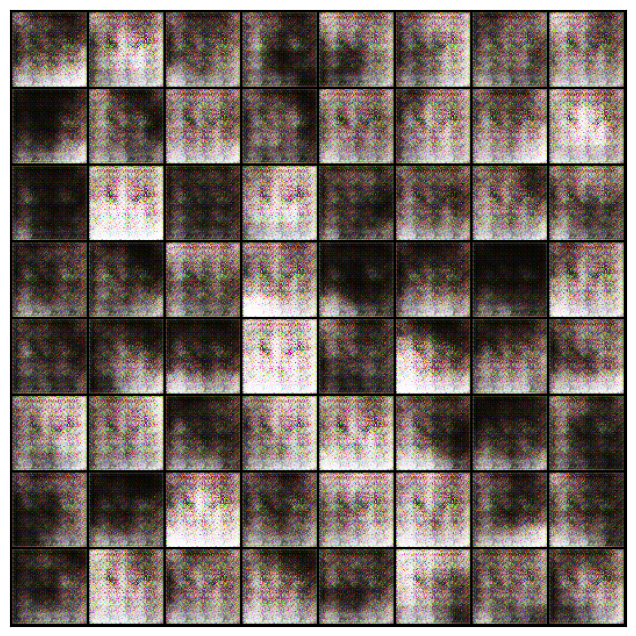

In [101]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Creation of GAN Components
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# Hyperparameters for GAN
nz = 100 
ngf = 64 
ndf = 64  
nc = 3  

# Creation of the generator and discriminator
generator = Generator(nz, ngf, nc)
discriminator = Discriminator(ndf, nc)

# Definition of Optimizers for both Generator and Discriminator
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Definition of Loss Function
criterion = nn.BCELoss()

# Training Loop
num_epochs = 1

for epoch in range(num_epochs):
    for real_images, _ in train_dl:
        batch_size = real_images.size(0)

        # Training of Discriminator
        real_labels = torch.ones(batch_size)
        fake_labels = torch.zeros(batch_size)

        discriminator.zero_grad()

        # Real images
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, nz, 1, 1)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        d_optimizer.step()

        # Training of Generator
        generator.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        g_optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss_real.item() + d_loss_fake.item():.4f}, g_loss: {g_loss.item():.4f}")

# Function to show generated images
def show_generated_images(generator, num_images=64):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images), nrow=8).permute(1, 2, 0))
    plt.show()

# Displays some generated images
show_generated_images(generator)

In [104]:
def calculate_realism_score(generator, discriminator, nz, num_samples=1000):
    # Generates a batch of fake images
    z = torch.randn(num_samples, nz, 1, 1)
    fake_images = generator(z)

    # Evaluates the fake images with the discriminator
    with torch.no_grad():
        scores = discriminator(fake_images)

    # Calculates the average score
    realism_score = scores.mean().item()

    return realism_score

# Calculates the realism score
realism_score = calculate_realism_score(generator, discriminator, nz)
print("Realism Score:", realism_score)

Realism Score: 0.7948289513587952


## GAN (18 Epochs)

Epoch [1/18], d_loss: 0.5887, g_loss: 5.7505
Epoch [2/18], d_loss: 0.7988, g_loss: 11.1531
Epoch [3/18], d_loss: 1.6672, g_loss: 11.7337
Epoch [4/18], d_loss: 0.6017, g_loss: 2.6569
Epoch [5/18], d_loss: 0.9618, g_loss: 5.2487
Epoch [6/18], d_loss: 0.2652, g_loss: 10.0929
Epoch [7/18], d_loss: 0.6736, g_loss: 12.6810
Epoch [8/18], d_loss: 1.1844, g_loss: 2.6820
Epoch [9/18], d_loss: 0.5044, g_loss: 2.0980
Epoch [10/18], d_loss: 0.2601, g_loss: 7.1524
Epoch [11/18], d_loss: 0.0993, g_loss: 4.4398
Epoch [12/18], d_loss: 0.1663, g_loss: 6.7811
Epoch [13/18], d_loss: 0.4091, g_loss: 7.8856
Epoch [14/18], d_loss: 1.6321, g_loss: 4.7689
Epoch [15/18], d_loss: 0.2664, g_loss: 6.9938
Epoch [16/18], d_loss: 0.1226, g_loss: 6.2292
Epoch [17/18], d_loss: 0.2806, g_loss: 4.0996
Epoch [18/18], d_loss: 1.9673, g_loss: 0.1420


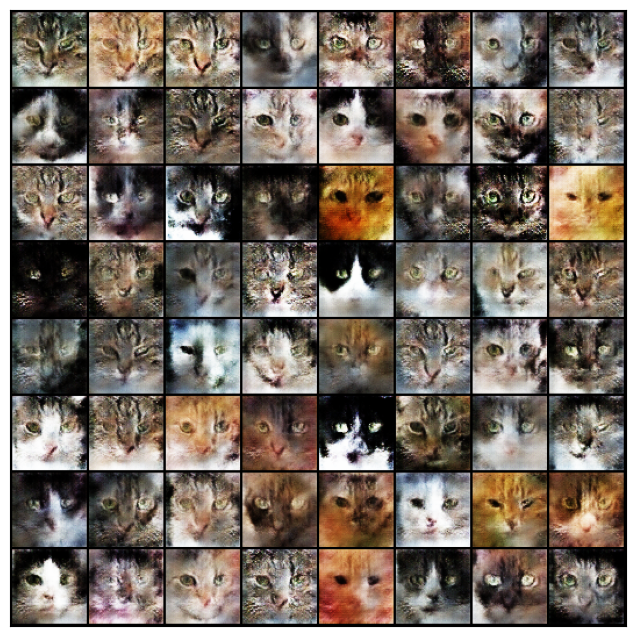

In [45]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Creation of GAN Components
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# Hyperparameters for GAN
nz = 100 
ngf = 64 
ndf = 64  
nc = 3  

# Creation of the generator and discriminator
generator = Generator(nz, ngf, nc)
discriminator = Discriminator(ndf, nc)

# Definition of Optimizers for both Generator and Discriminator
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Definition of Loss Function
criterion = nn.BCELoss()
a
# Training Loop
num_epochs = 18

for epoch in range(num_epochs):
    for real_images, _ in train_dl:
        batch_size = real_images.size(0)

        # Training of Discriminator
        real_labels = torch.ones(batch_size)
        fake_labels = torch.zeros(batch_size)

        discriminator.zero_grad()

        # Real images
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, nz, 1, 1)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        d_optimizer.step()

        # Training of Generator
        generator.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        g_optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss_real.item() + d_loss_fake.item():.4f}, g_loss: {g_loss.item():.4f}")

# Function to show generated images
def show_generated_images(generator, num_images=64):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images), nrow=8).permute(1, 2, 0))
    plt.show()

# Display of some generated images
show_generated_images(generator)

In [68]:
def realism_score(generator, discriminator, nz, num_images=1000):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    with torch.no_grad():
        outputs = discriminator(fake_images)
    score = outputs.mean().item()
    return score

# Example usage
score = realism_score(generator, discriminator, nz)
print("Realism Score:", score)

Realism Score: 0.0067930640652775764


# Auto-Regressive Model 

Epoch [1/5], Loss: 0.1477
Epoch [2/5], Loss: 0.1129
Epoch [3/5], Loss: 0.1927
Epoch [4/5], Loss: 0.3074


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [5/5], Loss: 0.2056


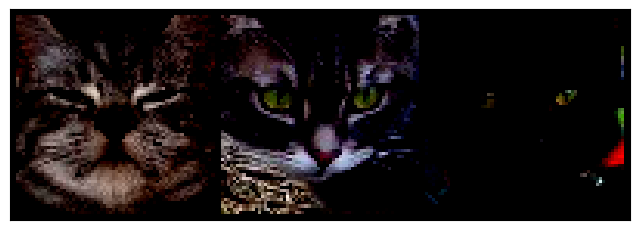

In [91]:
import torch
import torch.nn as nn
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

class AutoRegressiveModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(AutoRegressiveModel, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, output_channels, kernel_size=3, padding=1),
            nn.Sigmoid()  
        )

    def forward(self, x):
        return self.net(x)
    
image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)


# Creates the model
input_channels = 3  
output_channels = 3  
model = AutoRegressiveModel(input_channels, output_channels)

# Definition of the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Definition of the loss function
criterion = nn.MSELoss()

# Training loop
num_epochs = 5 

for epoch in range(num_epochs):
    for images, _ in train_dl:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Function to show generated images
def show_images(batch, num_images=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(batch[:num_images], nrow=8).permute(1, 2, 0))
    plt.show()

# Displays some images
show_images(images)

In [92]:
import torch

def calculate_average_metrics(model, data_loader, mse_criterion):
    total_mse = 0.0
    total_mae = 0.0
    total_samples = 0

    model.eval()  
    with torch.no_grad(): 
        for images, _ in data_loader:
            outputs = model(images)
            mse_loss = mse_criterion(outputs, images)
            mae_loss = torch.mean(torch.abs(outputs - images))
            
            total_mse += mse_loss.item() * images.size(0)
            total_mae += mae_loss.item() * images.size(0)
            total_samples += images.size(0)

    average_mse = total_mse / total_samples
    average_mae = total_mae / total_samples
    return average_mse, average_mae

# Calculates the average MSE and MAE after training
mse_criterion = nn.MSELoss()
average_mse, average_mae = calculate_average_metrics(model, train_dl, mse_criterion)
print(f'Average MSE: {average_mse:.4f}')
print(f'Average MAE: {average_mae:.4f}')

Average MSE: 0.1927
Average MAE: 0.3070


# Boosting Techniques

# Auto-Regressive Model (50 Epochs)

Epoch [1/50], Loss: 0.1088
Epoch [2/50], Loss: 0.1271
Epoch [3/50], Loss: 0.2396
Epoch [4/50], Loss: 0.1053
Epoch [5/50], Loss: 0.0881
Epoch [6/50], Loss: 0.2215
Epoch [7/50], Loss: 0.2985
Epoch [8/50], Loss: 0.0598
Epoch [9/50], Loss: 0.1210
Epoch [10/50], Loss: 0.2535
Epoch [11/50], Loss: 0.0987
Epoch [12/50], Loss: 0.0530
Epoch [13/50], Loss: 0.1429
Epoch [14/50], Loss: 0.2821
Epoch [15/50], Loss: 0.1619
Epoch [16/50], Loss: 0.0862
Epoch [17/50], Loss: 0.3876
Epoch [18/50], Loss: 0.1251
Epoch [19/50], Loss: 0.1805
Epoch [20/50], Loss: 0.1442
Epoch [21/50], Loss: 0.1815
Epoch [22/50], Loss: 0.1244
Epoch [23/50], Loss: 0.4884
Epoch [24/50], Loss: 0.1594
Epoch [25/50], Loss: 0.1550
Epoch [26/50], Loss: 0.0918
Epoch [27/50], Loss: 0.1310
Epoch [28/50], Loss: 0.0992
Epoch [29/50], Loss: 0.1746
Epoch [30/50], Loss: 0.1505
Epoch [31/50], Loss: 0.0896
Epoch [32/50], Loss: 0.1673
Epoch [33/50], Loss: 0.3143
Epoch [34/50], Loss: 0.3469
Epoch [35/50], Loss: 0.1798
Epoch [36/50], Loss: 0.2160
E

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [50/50], Loss: 0.1527


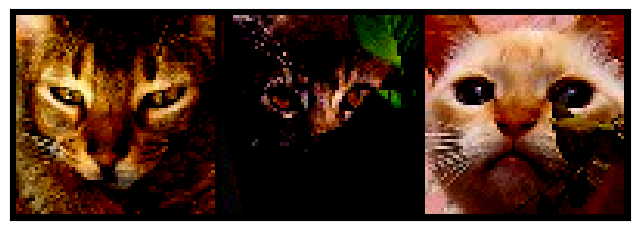

In [93]:
class AutoRegressiveModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(AutoRegressiveModel, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, output_channels, kernel_size=3, padding=1),
            nn.Sigmoid()  
        )

    def forward(self, x):
        return self.net(x)
    
image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)


# Creates the model
input_channels = 3  
output_channels = 3  
model = AutoRegressiveModel(input_channels, output_channels)

# Definition of the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Definition of the loss function
criterion = nn.MSELoss()

# Training loop
num_epochs = 50

for epoch in range(num_epochs):
    for images, _ in train_dl:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Function to show generated images
def show_images(batch, num_images=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(batch[:num_images], nrow=8).permute(1, 2, 0))
    plt.show()

# Displays some images
show_images(images)

In [94]:
import torch

def calculate_average_metrics(model, data_loader, mse_criterion):
    total_mse = 0.0
    total_mae = 0.0
    total_samples = 0

    model.eval()  
    with torch.no_grad():  
        for images, _ in data_loader:
            outputs = model(images)
            mse_loss = mse_criterion(outputs, images)
            mae_loss = torch.mean(torch.abs(outputs - images))
            
            total_mse += mse_loss.item() * images.size(0)
            total_mae += mae_loss.item() * images.size(0)
            total_samples += images.size(0)

    average_mse = total_mse / total_samples
    average_mae = total_mae / total_samples
    return average_mse, average_mae

# Calculates the average MSE and MAE after training
mse_criterion = nn.MSELoss()
average_mse, average_mae = calculate_average_metrics(model, train_dl, mse_criterion)
print(f'Average MSE: {average_mse:.4f}')
print(f'Average MAE: {average_mae:.4f}')

Average MSE: 0.1918
Average MAE: 0.2983


## Removing Outliers (1 epoch)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [1/1], Loss: 0.1145


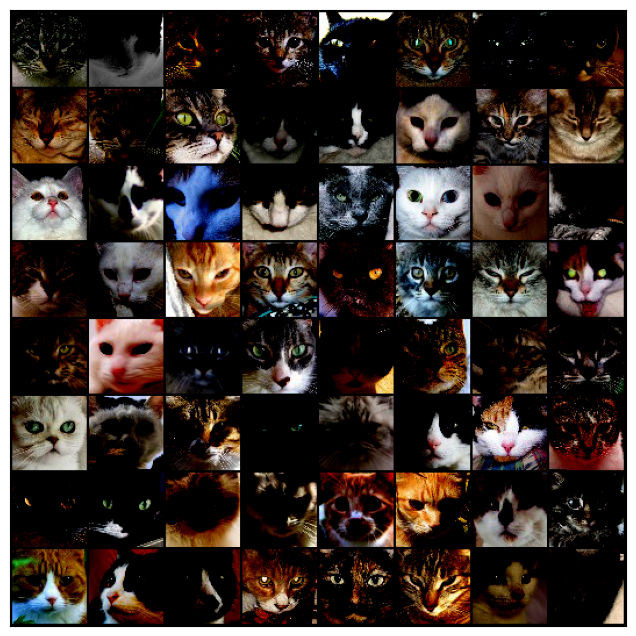

In [95]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

class AutoRegressiveModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(AutoRegressiveModel, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, output_channels, kernel_size=3, padding=1),
            nn.Sigmoid()  
        )
        
    def forward(self, x):
        return self.net(x)
    

image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

# Loads the dataset without normalization for outlier detection
train_ds_raw = datasets.ImageFolder(root=data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor()
]))

# Outlier detection function
def is_outlier(image, threshold=3):
    image_array = image.numpy()
    mean, std = np.mean(image_array), np.std(image_array)
    return mean > mean_global + threshold * std_global or mean < mean_global - threshold * std_global

# Computes the global mean and std for the dataset
means, stds = [], []
for image, _ in train_ds_raw:
    image_array = image.numpy()
    means.append(np.mean(image_array))
    stds.append(np.std(image_array))
mean_global, std_global = np.mean(means), np.mean(stds)

# Filters out outliers
filtered_indices = [i for i, (img, _) in enumerate(train_ds_raw) if not is_outlier(img)]
filtered_ds = torch.utils.data.Subset(train_ds_raw, filtered_indices)

# Applies normalization to the filtered dataset
filtered_ds.dataset.transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

# DataLoader for the filtered dataset
train_dl = DataLoader(filtered_ds, batch_size=batch_size, shuffle=True)

# Creates the model
input_channels = 3  
output_channels = 3  
model = AutoRegressiveModel(input_channels, output_channels)

# Definition of the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.MSELoss()

# Training loop
num_epochs = 1
for epoch in range(num_epochs):
    for images, _ in train_dl:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Display function for images
def show_images(batch, num_images=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(batch[:num_images], nrow=8).permute(1, 2, 0))
    plt.show()

# Displays some images
images, _ = next(iter(train_dl))
show_images(images)


In [96]:
import torch

def calculate_average_metrics(model, data_loader, mse_criterion):
    total_mse = 0.0
    total_mae = 0.0
    total_samples = 0

    model.eval()  
    with torch.no_grad():  
        for images, _ in data_loader:
            outputs = model(images)
            mse_loss = mse_criterion(outputs, images)
            mae_loss = torch.mean(torch.abs(outputs - images))
            
            total_mse += mse_loss.item() * images.size(0)
            total_mae += mae_loss.item() * images.size(0)
            total_samples += images.size(0)

    average_mse = total_mse / total_samples
    average_mae = total_mae / total_samples
    return average_mse, average_mae

# Calculates the average MSE and MAE after training
mse_criterion = nn.MSELoss()
average_mse, average_mae = calculate_average_metrics(model, train_dl, mse_criterion)
print(f'Average MSE: {average_mse:.4f}')
print(f'Average MAE: {average_mae:.4f}')


Average MSE: 0.1962
Average MAE: 0.3227


## Removing Outliers (50 epochs)

Epoch [1/50], Loss: 0.1032
Epoch [2/50], Loss: 0.1441
Epoch [3/50], Loss: 0.1244
Epoch [4/50], Loss: 0.1274
Epoch [5/50], Loss: 0.1167
Epoch [6/50], Loss: 0.1051
Epoch [7/50], Loss: 0.1904
Epoch [8/50], Loss: 0.0603
Epoch [9/50], Loss: 0.2207
Epoch [10/50], Loss: 0.2550
Epoch [11/50], Loss: 0.1338
Epoch [12/50], Loss: 0.1640
Epoch [13/50], Loss: 0.2396
Epoch [14/50], Loss: 0.1447
Epoch [15/50], Loss: 0.2598
Epoch [16/50], Loss: 0.2317
Epoch [17/50], Loss: 0.1930
Epoch [18/50], Loss: 0.1590
Epoch [19/50], Loss: 0.0939
Epoch [20/50], Loss: 0.0355
Epoch [21/50], Loss: 0.2225
Epoch [22/50], Loss: 0.2598
Epoch [23/50], Loss: 0.0960
Epoch [24/50], Loss: 0.1190
Epoch [25/50], Loss: 0.1526
Epoch [26/50], Loss: 0.0948
Epoch [27/50], Loss: 0.0977
Epoch [28/50], Loss: 0.3403
Epoch [29/50], Loss: 0.2927
Epoch [30/50], Loss: 0.2765
Epoch [31/50], Loss: 0.1093
Epoch [32/50], Loss: 0.1360
Epoch [33/50], Loss: 0.0938
Epoch [34/50], Loss: 0.2098
Epoch [35/50], Loss: 0.2164
Epoch [36/50], Loss: 0.1355
E

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [50/50], Loss: 0.1233


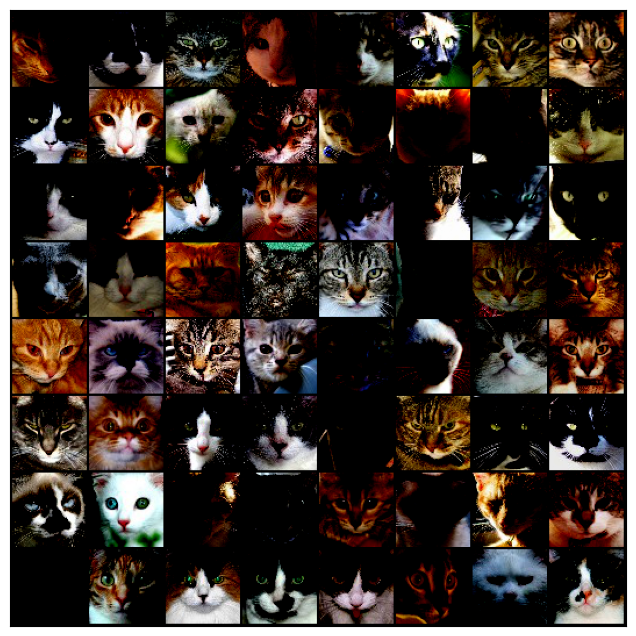

In [97]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

class AutoRegressiveModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(AutoRegressiveModel, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, output_channels, kernel_size=3, padding=1),
            nn.Sigmoid()  
        )
        
    def forward(self, x):
        return self.net(x)
    

image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

# Loads dataset without normalization for outlier detection
train_ds_raw = datasets.ImageFolder(root=data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor()
]))

# Outlier detection function
def is_outlier(image, threshold=3):
    image_array = image.numpy()
    mean, std = np.mean(image_array), np.std(image_array)
    return mean > mean_global + threshold * std_global or mean < mean_global - threshold * std_global

# Computes the global mean and std for the dataset
means, stds = [], []
for image, _ in train_ds_raw:
    image_array = image.numpy()
    means.append(np.mean(image_array))
    stds.append(np.std(image_array))
mean_global, std_global = np.mean(means), np.mean(stds)

# Filters out outliers
filtered_indices = [i for i, (img, _) in enumerate(train_ds_raw) if not is_outlier(img)]
filtered_ds = torch.utils.data.Subset(train_ds_raw, filtered_indices)

# Applies normalization to the filtered dataset
filtered_ds.dataset.transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

# DataLoader for the filtered dataset
train_dl = DataLoader(filtered_ds, batch_size=batch_size, shuffle=True)

# Creates the model
input_channels = 3  
output_channels = 3  
model = AutoRegressiveModel(input_channels, output_channels)

# Definition of the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.MSELoss()

# Training loop
num_epochs = 50
for epoch in range(num_epochs):
    for images, _ in train_dl:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Display function for images
def show_images(batch, num_images=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(batch[:num_images], nrow=8).permute(1, 2, 0))
    plt.show()

# Displays some images
images, _ = next(iter(train_dl))
show_images(images)

In [98]:
import torch

def calculate_average_metrics(model, data_loader, mse_criterion):
    total_mse = 0.0
    total_mae = 0.0
    total_samples = 0

    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():  # No gradients needed for evaluation
        for images, _ in data_loader:
            outputs = model(images)
            mse_loss = mse_criterion(outputs, images)
            mae_loss = torch.mean(torch.abs(outputs - images))
            
            total_mse += mse_loss.item() * images.size(0)
            total_mae += mae_loss.item() * images.size(0)
            total_samples += images.size(0)

    average_mse = total_mse / total_samples
    average_mae = total_mae / total_samples
    return average_mse, average_mae

# Calculates the average MSE and MAE after training
mse_criterion = nn.MSELoss()
average_mse, average_mae = calculate_average_metrics(model, train_dl, mse_criterion)
print(f'Average MSE: {average_mse:.4f}')
print(f'Average MAE: {average_mae:.4f}')


Average MSE: 0.1920
Average MAE: 0.3020


## Auto-Regressive Model (1 epoch)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [1/1], Loss: 0.1253


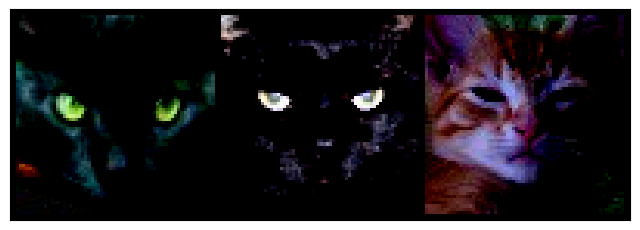

In [99]:
class AutoRegressiveModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(AutoRegressiveModel, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, output_channels, kernel_size=3, padding=1),
            nn.Sigmoid()  
        )

    def forward(self, x):
        return self.net(x)
    
image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)


# Creates the model
input_channels = 3  
output_channels = 3  
model = AutoRegressiveModel(input_channels, output_channels)

# Definition of the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Definition of the loss function
criterion = nn.MSELoss()

# Training loop
num_epochs = 1

for epoch in range(num_epochs):
    for images, _ in train_dl:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Function to show generated images
def show_images(batch, num_images=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(batch[:num_images], nrow=8).permute(1, 2, 0))
    plt.show()

# Displays some images
show_images(images)

In [100]:
import torch

def calculate_average_metrics(model, data_loader, mse_criterion):
    total_mse = 0.0
    total_mae = 0.0
    total_samples = 0

    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():  # No gradients needed for evaluation
        for images, _ in data_loader:
            outputs = model(images)
            mse_loss = mse_criterion(outputs, images)
            mae_loss = torch.mean(torch.abs(outputs - images))
            
            total_mse += mse_loss.item() * images.size(0)
            total_mae += mae_loss.item() * images.size(0)
            total_samples += images.size(0)

    average_mse = total_mse / total_samples
    average_mae = total_mae / total_samples
    return average_mse, average_mae

# Calculates the average MSE and MAE after training
mse_criterion = nn.MSELoss()
average_mse, average_mae = calculate_average_metrics(model, train_dl, mse_criterion)
print(f'Average MSE: {average_mse:.4f}')
print(f'Average MAE: {average_mae:.4f}')

Average MSE: 0.1965
Average MAE: 0.3235


# Autoencoder

In [107]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder

# Defines the autoencoder model
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# Creates an instance of the autoencoder
autoencoder = Autoencoder()

# Defines the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.001)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    for data in train_dl:
        inputs, _ = data
        optimizer.zero_grad()
        outputs = autoencoder(inputs)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

torch.save(autoencoder.state_dict(), 'autoencoder_model.pth')


Epoch [1/10], Loss: 0.0213
Epoch [2/10], Loss: 0.0199
Epoch [3/10], Loss: 0.0102
Epoch [4/10], Loss: 0.0129
Epoch [5/10], Loss: 0.0160
Epoch [6/10], Loss: 0.0063
Epoch [7/10], Loss: 0.0094
Epoch [8/10], Loss: 0.0114
Epoch [9/10], Loss: 0.0237
Epoch [10/10], Loss: 0.0074


Average MSE: 0.0079
Average MAE: 0.0588


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

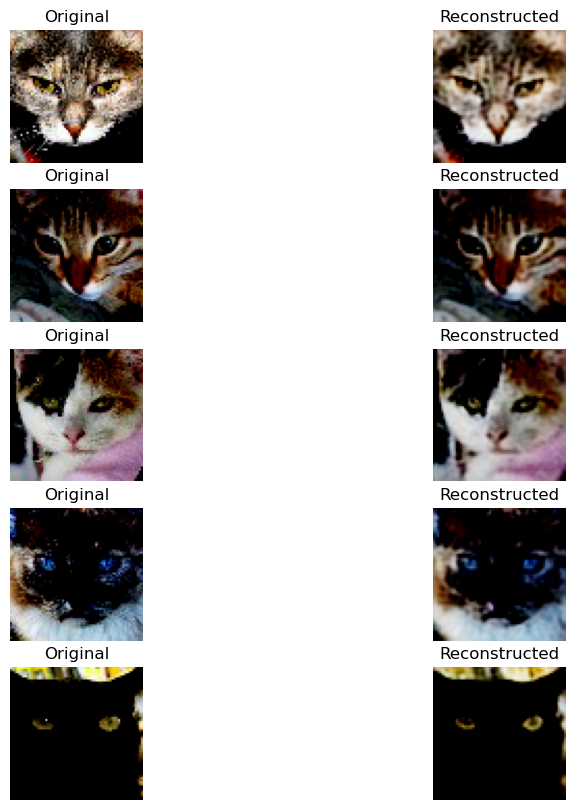

In [108]:
import torch
import matplotlib.pyplot as plt
import torch.nn as nn

def display_images(autoencoder, dataloader, num_images=20):
    autoencoder.eval()

    # Gets a batch of data from the DataLoader
    for batch in dataloader:
        images, _ = batch  

        # Selects a random subset of images
        indices = torch.randint(0, len(images), (num_images,))
        selected_images = images[indices]

        # Encodes the selected images
        encoded_images = autoencoder.encoder(selected_images)

        # Decodes the encoded images
        decoded_images = autoencoder.decoder(encoded_images)

        # Calculates the MSE and MAE
        mse_loss = nn.MSELoss(reduction='mean')
        mae_loss = nn.L1Loss(reduction='mean')

        mse_values = []
        mae_values = []

        for i in range(num_images):
            mse = mse_loss(decoded_images[i], selected_images[i])
            mae = mae_loss(decoded_images[i], selected_images[i])

            mse_values.append(mse.item())
            mae_values.append(mae.item())

        return selected_images, decoded_images, mse_values, mae_values

selected_images, decoded_images, mse_values, mae_values = display_images(autoencoder, train_dl)

# Calculates the average MSE and MAE
average_mse = sum(mse_values) / len(mse_values)
average_mae = sum(mae_values) / len(mae_values)

print(f'Average MSE: {average_mse:.4f}')
print(f'Average MAE: {average_mae:.4f}')

# Visualizes example images and their reconstructions
num_display = min(5, len(selected_images))  # Display at most 5 images
fig, axes = plt.subplots(num_display, 2, figsize=(10, 2 * num_display))

for i in range(num_display):
    # Plots original images
    axes[i, 0].imshow(selected_images[i].permute(1, 2, 0).cpu().numpy())
    axes[i, 0].set_title('Original')
    axes[i, 0].axis('off')

    # Plots reconstructed images
    axes[i, 1].imshow(decoded_images[i].permute(1, 2, 0).cpu().detach().numpy())
    axes[i, 1].set_title('Reconstructed')
    axes[i, 1].axis('off')

plt.show()

# Boosting Techniques

# Decreasing Epochs to 1

In [109]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder

# Defines the autoencoder model
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# Creates an instance of the autoencoder
autoencoder = Autoencoder()

# Defines the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.001)

# Training loop
num_epochs = 1

for epoch in range(num_epochs):
    for data in train_dl:
        inputs, _ = data
        optimizer.zero_grad()
        outputs = autoencoder(inputs)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

torch.save(autoencoder.state_dict(), 'autoencoder_model.pth')

Epoch [1/1], Loss: 0.0218


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Average MSE: 0.0201
Average MAE: 0.0976


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


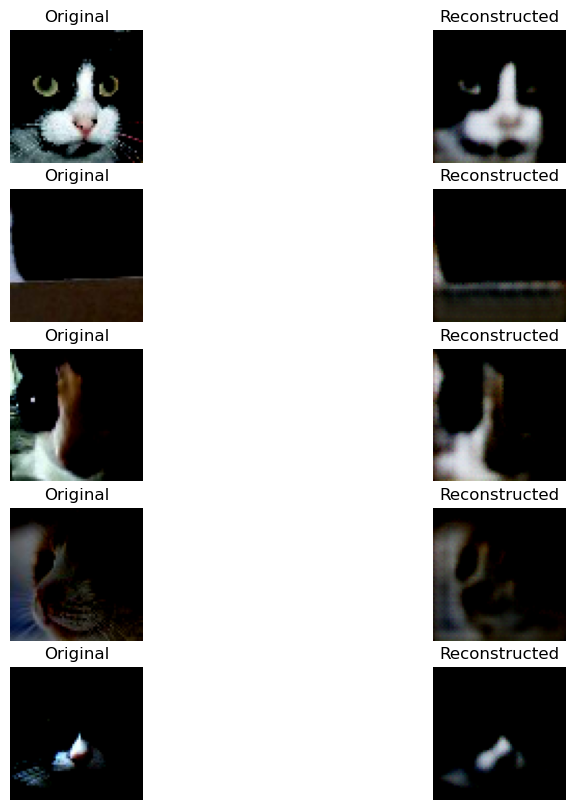

In [110]:
import torch
import matplotlib.pyplot as plt
import torch.nn as nn

def display_images(autoencoder, dataloader, num_images=20):
    autoencoder.eval()

    # Gets a batch of data from the DataLoader
    for batch in dataloader:
        images, _ = batch  

        # Selects a random subset of images
        indices = torch.randint(0, len(images), (num_images,))
        selected_images = images[indices]

        # Encodes the selected images
        encoded_images = autoencoder.encoder(selected_images)

        # Decodes the encoded images
        decoded_images = autoencoder.decoder(encoded_images)

        # Calculates the MSE and MAE
        mse_loss = nn.MSELoss(reduction='mean')
        mae_loss = nn.L1Loss(reduction='mean')

        mse_values = []
        mae_values = []

        for i in range(num_images):
            mse = mse_loss(decoded_images[i], selected_images[i])
            mae = mae_loss(decoded_images[i], selected_images[i])

            mse_values.append(mse.item())
            mae_values.append(mae.item())

        return selected_images, decoded_images, mse_values, mae_values

selected_images, decoded_images, mse_values, mae_values = display_images(autoencoder, train_dl)

# Calculates the average MSE and MAE
average_mse = sum(mse_values) / len(mse_values)
average_mae = sum(mae_values) / len(mae_values)

print(f'Average MSE: {average_mse:.4f}')
print(f'Average MAE: {average_mae:.4f}')

# Visualizes example images and their reconstructions
num_display = min(5, len(selected_images))  # Display at most 5 images
fig, axes = plt.subplots(num_display, 2, figsize=(10, 2 * num_display))

for i in range(num_display):
    # Plots original images
    axes[i, 0].imshow(selected_images[i].permute(1, 2, 0).cpu().numpy())
    axes[i, 0].set_title('Original')
    axes[i, 0].axis('off')

    # Plots reconstructed images
    axes[i, 1].imshow(decoded_images[i].permute(1, 2, 0).cpu().detach().numpy())
    axes[i, 1].set_title('Reconstructed')
    axes[i, 1].axis('off')

plt.show()

# Increasing Epochs to 30

In [111]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder

# Defines the autoencoder model
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# Creates an instance of the autoencoder
autoencoder = Autoencoder()

# Defines the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.001)

# Training loop
num_epochs = 30

for epoch in range(num_epochs):
    for data in train_dl:
        inputs, _ = data
        optimizer.zero_grad()
        outputs = autoencoder(inputs)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

torch.save(autoencoder.state_dict(), 'autoencoder_model.pth')


Epoch [1/30], Loss: 0.0491
Epoch [2/30], Loss: 0.0278
Epoch [3/30], Loss: 0.0182
Epoch [4/30], Loss: 0.0061
Epoch [5/30], Loss: 0.0166
Epoch [6/30], Loss: 0.0101
Epoch [7/30], Loss: 0.0102
Epoch [8/30], Loss: 0.0120
Epoch [9/30], Loss: 0.0119
Epoch [10/30], Loss: 0.0098
Epoch [11/30], Loss: 0.0107
Epoch [12/30], Loss: 0.0195
Epoch [13/30], Loss: 0.0090
Epoch [14/30], Loss: 0.0050
Epoch [15/30], Loss: 0.0060
Epoch [16/30], Loss: 0.0080
Epoch [17/30], Loss: 0.0029
Epoch [18/30], Loss: 0.0078
Epoch [19/30], Loss: 0.0074
Epoch [20/30], Loss: 0.0063
Epoch [21/30], Loss: 0.0069
Epoch [22/30], Loss: 0.0049
Epoch [23/30], Loss: 0.0067
Epoch [24/30], Loss: 0.0033
Epoch [25/30], Loss: 0.0078
Epoch [26/30], Loss: 0.0032
Epoch [27/30], Loss: 0.0099
Epoch [28/30], Loss: 0.0050
Epoch [29/30], Loss: 0.0025
Epoch [30/30], Loss: 0.0025


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Average MSE: 0.0044
Average MAE: 0.0457


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


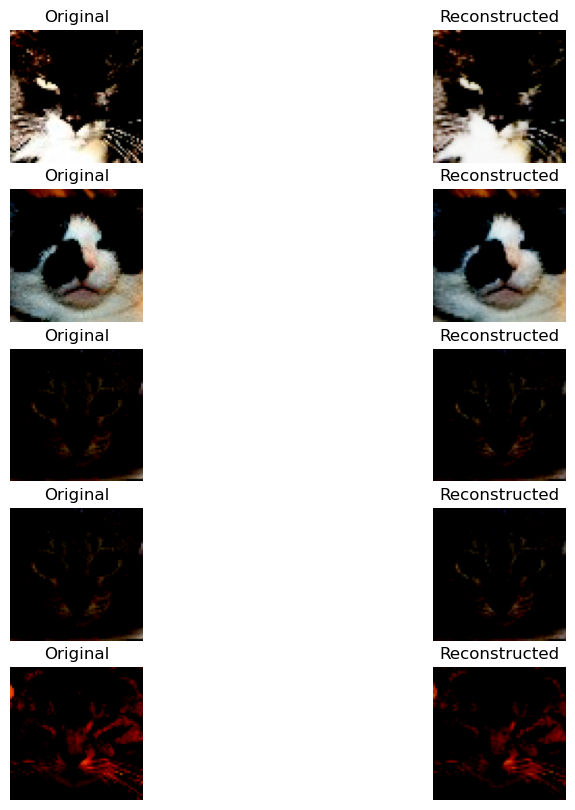

In [112]:
import torch
import matplotlib.pyplot as plt
import torch.nn as nn

def display_images(autoencoder, dataloader, num_images=20):
    autoencoder.eval()

    # Gets a batch of data from the DataLoader
    for batch in dataloader:
        images, _ = batch  

        # Selects a random subset of images
        indices = torch.randint(0, len(images), (num_images,))
        selected_images = images[indices]

        # Encodes the selected images
        encoded_images = autoencoder.encoder(selected_images)

        # Decodes the encoded images
        decoded_images = autoencoder.decoder(encoded_images)

        # Calculates the MSE and MAE
        mse_loss = nn.MSELoss(reduction='mean')
        mae_loss = nn.L1Loss(reduction='mean')

        mse_values = []
        mae_values = []

        for i in range(num_images):
            mse = mse_loss(decoded_images[i], selected_images[i])
            mae = mae_loss(decoded_images[i], selected_images[i])

            mse_values.append(mse.item())
            mae_values.append(mae.item())

        return selected_images, decoded_images, mse_values, mae_values

selected_images, decoded_images, mse_values, mae_values = display_images(autoencoder, train_dl)

# Calculates the average MSE and MAE
average_mse = sum(mse_values) / len(mse_values)
average_mae = sum(mae_values) / len(mae_values)

print(f'Average MSE: {average_mse:.4f}')
print(f'Average MAE: {average_mae:.4f}')

# Visualizes example images and their reconstructions
num_display = min(5, len(selected_images))  # Display at most 5 images
fig, axes = plt.subplots(num_display, 2, figsize=(10, 2 * num_display))

for i in range(num_display):
    # Plots original images
    axes[i, 0].imshow(selected_images[i].permute(1, 2, 0).cpu().numpy())
    axes[i, 0].set_title('Original')
    axes[i, 0].axis('off')

    # Plots reconstructed images
    axes[i, 1].imshow(decoded_images[i].permute(1, 2, 0).cpu().detach().numpy())
    axes[i, 1].set_title('Reconstructed')
    axes[i, 1].axis('off')

plt.show()